<h3 align="center">IMPLEMENTACIÓN DE ANÁLISIS MULTICRITERIO (SMCE) PARA LA LOCALIZACIÓN DE LÍNEAS DE TENSIÓN EN EL MUNICIPIO DE PUENTE NACIONAL - SANTANDER, COLOMBIA👩🏼‍🏭💡</h3>
<h5 align="center">Workshop 6. Análisis Multicriterio<em></em></h5>
<h6 align="center">Parte. No. 2</h6>

**Presentado por:** 
> Megan García Antivar 👾
> 
> María Fernanda López 👾

**Curso:** Geoprocesamiento- Maestría en Geomática, Universidad Nacional de Colombia

### A. Explicación de costos, beneficios y restricciones

Este Análisis Espacial Multicriterio (SMCE por sus siglas en inglés) identifica áreas adecuadas para la localización de líneas de tensión en el municipio de Puente Nacional, integrando factores y limitaciones derivadas de datos geoespaciales. Se utiliza la proximidad espacial a carreteras y cuerpos de agua, las condiciones topográficas, las restricciones legales y ambientales para fundamentar la decisión, además otros condicionantes como la existencia de otros proyectos licenciados (para evitar coexistencias). 

##### ✅ Factores
| No. | Criterio                           | Tipo SMCE | Explicación                                                                                    |
| --- | ---------------------------------- | --------- | ---------------------------------------------------------------------------------------------- |
| 1   | Pendiente (0–3%)                   | Beneficio | Pendientes suaves facilitan la intervención y reducen riesgos geotécnicos. ENERCA S.A E.S.P (2017) también menciona que es recomendable que las estructuras idealmente se sitúen en una pendiente de hasta 3%. |
| 2   | Pendiente (3–25%)                  | Costo | ENERCA S.A E.S.P (2017) establece que en terrenos escarpados la pendiente no podrá ser mayor al 30%. |
| 3   | Lejanía a vías (>30 m)             | Costo | Estar más alejado de vías (más de 30 m) reduce conflictos de uso y facilita planificación. La ley 1228 de 2008 del Congreso de Colombia establece como faja de retiro a vías de primer orden 60 m (totales), es decir, un buffer de 30 metros a cada lado.     |
| 4   | Lejanía a drenaje doble (>60 m)    | Beneficio | A mayor distancia de drenaje doble, menor riesgo de afectación hídrica. Decreto-Ley 2811 de 1974 establece como ronda hídrica, una faja paralela a la línea de mareas máximas o a la del cauce permanente de ríos y lagos, hasta de treinta metros de ancho. Sin embargo, por acto conservador y buscando generar el menor impacto a los cuerpos de agua se aumenta al doble.       |
| 5   | Lejanía a drenaje sencillo (>30 m)    | Beneficio | A mayor distancia de drenaje doble, menor riesgo de afectación hídrica. En consonancia con lo mencionado anteriormente, dado que no necesariamente los drenajes sencillos son cuerpos de agua permanente, se decide respetar la ronda hídrica.                        |
| 6   | Categorías de cobertura favorables | Beneficio | Coberturas que no son urbanas, bosques o ríos se consideran más adecuadas.      |
| 7   | Biomas compatibles     | Costo | Basado en el Manual de compensación del componente biótico (MinAmbiente, 2018), los biomas con un menor factor, implican, entre otras cosas una mayor representatividad, menor rareza, mayor remanencia y menor tasa de transformación. Con base en ello, se establece que los factores menores tienen un criterio de beneficio estableciendo en este caso particular el Orobioma Andino Guane-Yariguíes y Orobioma de Paramo Altoandino cordillera oriental. Como costo los biomas con mayor factor de compensación: Orobioma Subandino Guane-Yariguíes y Orobioma Andino Altoandino cordillera oriental      |


##### 🚫 Restricciones
| No. | Criterio                                | Tipo SMCA   | Explicación                                                                                     |
| --- | --------------------------------------- | ----------- | ----------------------------------------------------------------------------------------------- |
| 8   | Buffer de vías (≤30 m)                  | Restricción | Áreas cercanas a vías están excluidas por potenciales conflictos o normativas.                  |
| 9   | Zonas RUNAP                             | Restricción | Áreas protegidas legalmente excluyen intervención.                                              |
| 10   | Líneas UPME o de licenciamiento (≤30 m) | Restricción | Buffer de seguridad alrededor de infraestructura energética.                                    |
| 11   | Drenaje sencillo (≤30 m)                | Restricción | Áreas cercanas a drenaje natural requieren preservación ecológica.                              |
| 12  | Drenaje doble (≤60 m)                   | Restricción | Doble drenaje implica mayor vulnerabilidad, requiere exclusión directa.                         |
| 13  | Centros poblados (≤100 m)               | Restricción | Áreas cercanas a zonas habitadas se excluyen por normativa o conflictos de uso.                 |
| 14  | Pendiente >25°                          | Restricción | Pendientes pronunciadas presentan alto riesgo geotécnico y son inviables para intervención.     |
| 15  | Categorías de cobertura restringidas    | Restricción | Coberturas tipo 1, 3 y 5 (urbanas, bosques y ríos) son incompatibles con el uso. |

*Todos los GeoTIFFs producidos en el Cuaderno 1 son insumos directos para el Cuaderno 2.*

------

##### 📌 Notas:

- Un **beneficio** implica: a mayor valor, mayor idoneidad.
- Un **costo** implica: a menor valor, menor idoneidad.
- Una **restricción** es una exclusión estricta: a todas las áreas restringidas se les asigna una puntuación de idoneidad final de cero y se eliminan de la consideración.

## 0. Importar liberías

En esta sección se instalan y agrupan las librerías requeridas para el desarrollo del Análisis Multicriterio Espacial (SMCE).

In [17]:
import rasterio
import numpy as np
from scipy.ndimage import distance_transform_edt
import matplotlib.pyplot as plt
from rasterio.features import rasterize
from rasterio.warp import calculate_default_transform, reproject, Resampling
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.colors as mcolors
import geopandas as gpd

## 1. Preparación de la escena

### 1.1 Cargue de capas para el análisis de establecimiento de líneas de tensión

Esta sección carga todas las capas ráster previamente preparadas que están alineadas con la misma extensión, resolución y sistema de referencia de coordenadas (SRC). Estas capas se utilizarán para evaluar la aptitud con base en el terreno, la proximidad y las restricciones legales.

Los rásteres incluyen:

* **Pendientes**: Representa la pendiente del terreno en porcentaje.

* **Vías**: Ráster binario que muestra la ubicación de la infraestructura vial (1 = Vía).

* **Áreas protegidas**: Ráster binario donde se marcan las zonas protegidas (1 = protegida)

* **Otras líneas de tensión**: Ráster binario donde se marcan las líneas de tensión (1 = línea).

* **Otros proyectos lineales licenciados**: Ráster binario donde se marcan las líneas de otros proyectos licenciados (1 = proyecto licenciado).

* **Drenajes sencillos**: Ráster binario donde se marcan los drenajes sencillos (1 = drenajes sencillos).

* **Drenajes dobles**: Ráster binario donde se marcan los drenajes dobles (1 = drenajes dobles).

* **Centros poblados**: Ráster binario donde se marcan los centros poblados (1 = centros poblados).

* **Coberturas**: Ráster con las categorías de cobeturas según nivel 3 de Corine Land Cover (valores entre 111 y 511, por las categorías).

* **Biomas**: Ráster con las categorías de biomas (valores entre 1 a 4).

Estas capas servirán como insumo para generar tanto **factores** (por ejemplo, proximidad a carreteras) como **restricciones** (por ejemplo, áreas protegidas, pendiente elevada) en la evaluación multicriterio espacial.

In [59]:
# Definir rutas
m_root = r"/notebooks/Geoprocesamiento/Workshop/data/Workshop_6"

pendiente_path = m_root + "/pendiente_grados.tif"                   # Ruta del ráster de pendiente
vias_raster_path = m_root + "/raster_vial.tif"                      # Ruta del ráster de carreteras
drenajes_d_raster_path = m_root + "/raster_drenaje_doble.tif"       # Ruta del ráster de drenaje doble
drenajes_s_raster_path = m_root + "/raster_drenaje_sencillo.tif"    # Ruta del ráster de drenaje sencillo
runap_raster_path = m_root + "/raster_runap.tif"                    # Ruta del ráster de áreas protegidas
biomas_raster_path = m_root + "/raster_biomas.tif"                  # Ruta del ráster de biomas
coberturas_raster_path = m_root + "/raster_cobertura.tif"           # Ruta del ráster de coberturas de la tierra
centros_poblados_raster_path = m_root + "/raster_cp.tif"            # Ruta del ráster de centros poblados
lineas_licenciadas_raster_path = m_root + "/raster_lineas_lic.tif"  # Ruta del ráster de proyectos licenciados
lineas_UPME_raster_path = m_root + "/raster_lineas_upme.tif"        # Ruta del ráster de líneas de tensión

dst_crs = "EPSG:3116"  # MAGNA-SIRGAS / Colombia Bogotá

def cargar_y_reproyectar(ruta, nombre):
    with rasterio.open(ruta) as src:
        if src.crs.to_string() != dst_crs:
            print(f"{nombre}: reproyectando desde {src.crs} a {dst_crs}")
            transform, width, height = calculate_default_transform(
                src.crs, dst_crs, src.width, src.height, *src.bounds)
            data = np.empty((height, width), dtype=src.meta["dtype"])
            reproject(
                source=src.read(1),
                destination=data,
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest
            )
            meta = src.meta.copy()
            meta.update({"crs": dst_crs, "transform": transform, "width": width, "height": height})
            return data, meta
        else:
            print(f"{nombre}: ya está en {dst_crs}")
            return src.read(1), src.meta.copy()

pendiente, pendiente_meta = cargar_y_reproyectar(pendiente_path, "Pendiente")
vias, _ = cargar_y_reproyectar(vias_raster_path, "Vías")
drenajes_dobles, _ = cargar_y_reproyectar(drenajes_d_raster_path, "Drenajes dobles")
drenajes_sencillos, _ = cargar_y_reproyectar(drenajes_s_raster_path, "Drenajes sencillos")
runap, _ = cargar_y_reproyectar(runap_raster_path, "Áreas protegidas")
biomas, _ = cargar_y_reproyectar(biomas_raster_path, "Biomas")
coberturas, _ = cargar_y_reproyectar(coberturas_raster_path, "Coberturas")
centros_poblados, _ = cargar_y_reproyectar(centros_poblados_raster_path, "Centros poblados")
líneas_licenciadas, _ = cargar_y_reproyectar(lineas_licenciadas_raster_path, "Líneas licenciadas")
líneas_UPME, _ = cargar_y_reproyectar(lineas_UPME_raster_path, "Líneas UPME")

transform = pendiente_meta["transform"]
bounds = rasterio.transform.array_bounds(pendiente.shape[0], pendiente.shape[1], transform)

xmin, ymin, xmax, ymax = bounds
extent = [xmin, xmax, ymin, ymax]

Pendiente: ya está en EPSG:3116
Vías: reproyectando desde EPSG:4326 a EPSG:3116
Drenajes dobles: reproyectando desde EPSG:4326 a EPSG:3116
Drenajes sencillos: reproyectando desde EPSG:4326 a EPSG:3116
Áreas protegidas: reproyectando desde EPSG:4326 a EPSG:3116
Biomas: reproyectando desde EPSG:4326 a EPSG:3116
Coberturas: reproyectando desde EPSG:4326 a EPSG:3116
Centros poblados: reproyectando desde EPSG:4326 a EPSG:3116
Líneas licenciadas: reproyectando desde EPSG:4326 a EPSG:3116
Líneas UPME: reproyectando desde EPSG:4326 a EPSG:3116


## 2. Factores

### 2.1 Cálculo de distancia euclidiana a vías, drenajes, centros poblados y líneas eléctricas

Se calcula la distancia euclidiana desde cada celda hacia el píxel más cercano que representa una entidad geográfica (por ejemplo, vía, drenaje, línea eléctrica), utilizando la función `distance_transform_edt()` del módulo `scipy.ndimage`.

Dado que cada capa de entrada es un raster binario (donde `1` indica presencia del objeto y `0` su ausencia), primero se realiza una inversión de los valores. Esto es necesario porque la función de distancia mide la distancia hasta el valor cero, por lo que invertir (`== 0`) permite calcular correctamente la distancia desde las zonas sin objeto hacia el objeto más cercano.

La distancia se calcula inicialmente en píxeles, y luego se convierte a unidades espaciales reales (metros) multiplicando por el tamaño del píxel, extraído del objeto `transform` del raster de referencia.

Este procedimiento se aplicó a las siguientes capas geográficas:

* Vías
* Drenajes sencillos
* Drenajes dobles
* Centros poblados
* Líneas de transmisión licenciadas
* Líneas de transmisión UPME

Finalmente, se generaron los mapas de distancia (en metros) para cada una de las capas mencionadas, los cuales fueron visualizados mediante `matplotlib`.

Rásteres de distancia euclidiana calculados en unidades de mapa.


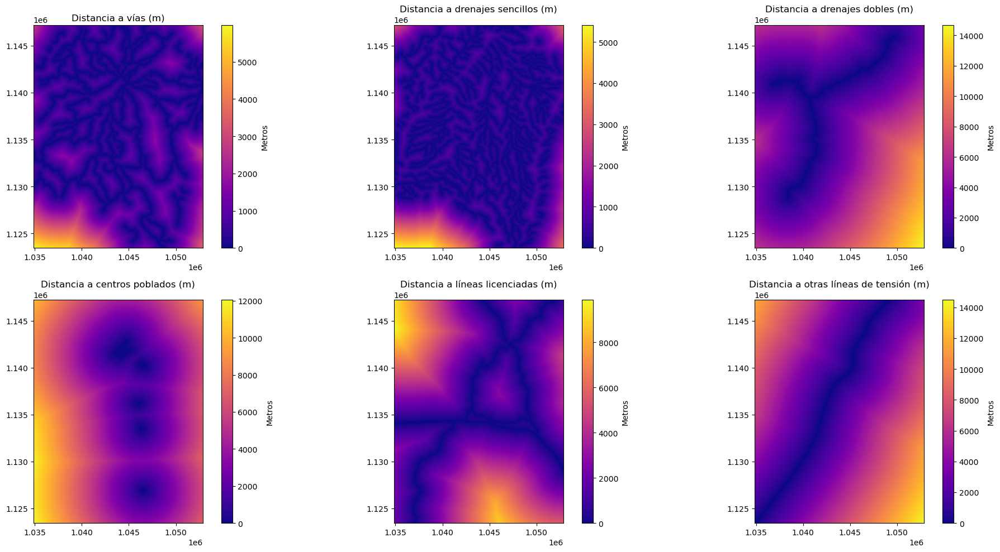

In [23]:
# 1. Abrir el raster binario de vías (1 = vía, 0 = fondo)
vias_inv = vias == 0
d_s_inv = drenajes_sencillos == 0
d_d_inv = drenajes_dobles == 0
centros_poblados_inv = centros_poblados == 0
líneas_licenciadas_inv = líneas_licenciadas == 0
líneas_UPME_inv = líneas_UPME == 0

#  Computar distancia euclidiana en pixeles
dist_vias_px = distance_transform_edt(vias_inv)
dist_d_s_px = distance_transform_edt(d_s_inv)
dist_d_d_px = distance_transform_edt(d_d_inv)
dist_c_c_px = distance_transform_edt(centros_poblados_inv)
dist_l_l_px = distance_transform_edt(líneas_licenciadas_inv)
dist_l_U_px = distance_transform_edt(líneas_UPME_inv)

# Convertir distancias a unidades de mapa utilizando el tamaño de píxel (suponiendo píxeles cuadrados)
pixel_size = transform[0]  # ancho de píxel en unidades de mapa (por ejemplo, metros)
dist_vias_m = dist_vias_px * pixel_size
dist_d_s_m = dist_d_s_px * pixel_size
dist_d_d_m = dist_d_d_px * pixel_size
dist_c_c_m = dist_c_c_px * pixel_size
dist_l_l_m = dist_l_l_px * pixel_size
dist_l_U_m = dist_l_U_px * pixel_size

print("Rásteres de distancia euclidiana calculados en unidades de mapa.")

# Visualización opcional
fig, axs = plt.subplots(2, 3, figsize=(20, 10))

img1 = axs[0, 0].imshow(dist_vias_m, cmap='plasma', extent=extent)
axs[0, 0].set_title("Distancia a vías (m)")
plt.colorbar(img1, ax=axs[0, 0], label="Metros")

img2 = axs[0, 1].imshow(dist_d_s_m, cmap='plasma', extent=extent)
axs[0, 1].set_title("Distancia a drenajes sencillos (m)")
plt.colorbar(img2, ax=axs[0, 1], label="Metros")

img3 = axs[0, 2].imshow(dist_d_d_m, cmap='plasma', extent=extent)
axs[0, 2].set_title("Distancia a drenajes dobles (m)")
plt.colorbar(img3, ax=axs[0, 2], label="Metros")

img4 = axs[1, 0].imshow(dist_c_c_m, cmap='plasma', extent=extent)
axs[1, 0].set_title("Distancia a centros poblados (m)")
plt.colorbar(img4, ax=axs[1, 0], label="Metros")

img5 = axs[1, 1].imshow(dist_l_l_m, cmap='plasma', extent=extent)
axs[1, 1].set_title("Distancia a líneas licenciadas (m)")
plt.colorbar(img5, ax=axs[1, 1], label="Metros")

img6 = axs[1, 2].imshow(dist_l_U_m, cmap='plasma', extent=extent)
axs[1, 2].set_title("Distancia a otras líneas de tensión (m)")
plt.colorbar(img6, ax=axs[1, 2], label="Metros")

plt.tight_layout()
plt.show()

### 2.2 Normalización de factores para el análisis espacial multicriterio (SMCE)

Para poder combinar múltiples capas espaciales con diferentes unidades y escalas, todos los factores deben ser transformados a una escala de aptitud común de 0 a 100, donde:

* 100 = condición óptima (máxima aptitud)
* 0 = condición inaceptable (mínima aptitud)

A continuación se describe la lógica de normalización aplicada a cada uno de los factores:

---------

🟫 **Pendiente (Factor de costo)**
* **Tipo**: Costo → las pendientes menores son más aptas.
* **Justificación**: Pendientes suaves permiten mayor facilidad de intervención, menor riesgo de erosión y viabilidad estructural. Pendientes mayores a 25° se consideran no aptas.
* **Método de normalización**: Clasificación segmentada en una escala de 0–10, luego escalada lineal a 0–100.
* **Umbrales**:
    * Pendiente entre 0–3° → aptitud = 100
    * Pendiente entre >3° y ≤25° → aptitud = 50
    * Pendiente >25° → aptitud = 0

🚗 **Proximidad a vías (Factor de beneficio)**
* **Tipo**: Beneficio → mayor distancia a las vías (más de 30 m) es más apta.
* **Justificación**: Aunque las vías son importantes para el acceso, las zonas muy cercanas (<30 m) son consideradas de conflicto o restricción por normativas o riesgos operativos.
* **Método de normalización**: Normalización lineal entre 30 y 2000 metros.
* **Umbrales**:
    * ≤30 m → aptitud = 0 (prohibición)
    * 30–2000 m → descenso lineal desde 100 a 0
    * 2000 m → aptitud = 0

🌊 **Proximidad a drenajes sencillos (Restricción)**
* **Tipo**: Restricción → zonas cercanas son no aptas.
* **Justificación**: Las áreas cercanas a drenajes naturales deben ser preservadas.
* **Método de normalización**: Clasificación binaria.
* **Umbrales**:
    * ≤30 m → aptitud = 0
    * 30 m → aptitud = 100

🌊 **Proximidad a drenajes dobles (Mixto)**
* **Tipo**: Combinado → zonas cercanas no aptas, intermedias con restricción, lejanas aptas.
* **Justificación**: Las zonas cercanas a drenajes dobles tienen mayor vulnerabilidad ambiental.
* **Método de normalización**: Clasificación segmentada.
* **Umbrales**:
    * ≤30 m → aptitud = 0
    * 30–60 m → aptitud = 50
    * 60 m → aptitud = 100

🏘️ **Proximidad a centros poblados (Beneficio y restricción)**
* **Tipo**: Restricción → zonas cercanas son no aptas.
* **Justificación**: Por normativa, no se deben desarrollar proyectos en zonas cercanas a núcleos urbanos.
* **Método de normalización**: Clasificación binaria.
* **Umbrales**:
    * ≤100 m → aptitud = 0
    * 100 m → aptitud = 100

⚡ **Proximidad a líneas eléctricas (Beneficio y restricción)**
* **Tipo**: Restricción → zonas cercanas son no aptas.
* **Justificación**: Se requiere una franja de exclusión por razones técnicas y de seguridad.
* **Método de normalización**: Clasificación binaria.
* **Umbrales**:
    * ≤30 m → aptitud = 0
    * 30 m → aptitud = 100

🌳 **Biomas (Beneficio y restricción)**
* **Tipo**: Restricción → Biomas 3.
* **Justificación**: Los mayores factores de compensación son restricción.
* **Método de normalización**: Clasificación binaria.
* **Umbrales**:
    * 3 → aptitud = 0
    * 1,2 y 4 → aptitud = 100

🌱 **Coberturas (Beneficio y restricción)**
* **Tipo**: Restricción → Coberturas que empiezan con 1,3 y 5.
* **Justificación**: Los ríos, bosques y tejido urbano son restricción.
* **Método de normalización**: Clasificación binaria.
* **Umbrales**:
    * 1,3 y 5 → aptitud = 0
    * 2 → aptitud = 100
      
--------
Todas las capas resultantes (pendiente_norm, vias_norm, drenaje_sencillo_norm, drenaje_doble_norm, cp_norm, lineas_lic_norm, lineas_upme_norm) se encuentran ahora en una escala común de aptitud de 0 a 100, y están listas para ser integradas mediante combinación ponderada en el modelo SMCE.

#### 🏔️ 1. Pendiente (Coste – menor es mejor)

In [24]:
def clasificar_pendiente_segmentada(pendiente_array):
    """
    Clasificación basada en rangos definidos:
    0–3° → beneficio (10)
    3–25° → costo (5)
    >25° → restricción (0)
    """
    return np.where(pendiente_array <= 3, 10,
             np.where(pendiente_array <= 25, 5, 0))

pendiente_norm = clasificar_pendiente_segmentada(pendiente)
print("✅ Pendiente clasificada por rangos: 0–3° = 10, 3–25° = 5, >25° = 0")

✅ Pendiente clasificada por rangos: 0–3° = 10, 3–25° = 5, >25° = 0


#### 🛣️ 2. Distancia a vías (Beneficio – mayor a 30 m es mejor)

In [25]:
def normalizar_proximidad(dist_array, umbral=2000.0, prohibicion=30.0):
    """
    Normaliza una variable de proximidad en una escala 0–10.
    Si está dentro del buffer de prohibición (ej. 30 m), devuelve 0.
    De 30 m a umbral, escala lineal descendente (más lejos = mejor).
    """
    norm = np.where(
        dist_array <= prohibicion,
        0,  # prohibido
        10 * (1 - (np.clip(dist_array, prohibicion, umbral) - prohibicion) / (umbral - prohibicion))
    )
    return np.clip(norm, 0, 10)

vias_norm = normalizar_proximidad(dist_vias_m, umbral=2000.0, prohibicion=30.0)
print("✅ Proximidad a vías normalizada (0–10): >30 m = mejor")

✅ Proximidad a vías normalizada (0–10): >30 m = mejor


#### 💧 3. Distancia a drenajes sencillos (Restricción pura hasta 30 m)

In [26]:
def normalizar_drenaje_sencillo(dist_array, prohibicion=30.0):
    """
    Si está dentro de 30 m del drenaje, no apto (0).
    Más allá = totalmente apto (10).
    """
    return np.where(dist_array <= prohibicion, 0, 10)

drenaje_sencillo_norm = normalizar_drenaje_sencillo(dist_d_s_m)
print("✅ Drenaje sencillo normalizado: <30 m = 0, >30 m = 10")

✅ Drenaje sencillo normalizado: <30 m = 0, >30 m = 10


#### 💧 4. Drenaje doble (Prohibición 0–30 m, intermedio 30–60 m, beneficio >60 m)

In [27]:
def normalizar_drenaje_doble(dist_array):
    """
    0–30 m = no apto (0), 30–60 m = intermedio (5), >60 m = apto (10)
    """
    norm = np.where(dist_array <= 30, 0,
             np.where(dist_array <= 60, 5, 10))
    return norm

drenaje_doble_norm = normalizar_drenaje_doble(dist_d_d_m)
print("✅ Drenaje doble normalizado: 0–30 m = 0, 30–60 m = 5, >60 m = 10")

✅ Drenaje doble normalizado: 0–30 m = 0, 30–60 m = 5, >60 m = 10


#### 🌇 5. Centros poblados (Restricción total a 100 m)

In [28]:
def normalizar_cp(dist_array, prohibicion=100.0):
    return np.where(dist_array <= prohibicion, 0, 10)

cp_norm = normalizar_cp(dist_c_c_m)
print("✅ Centros poblados normalizados: <100 m = 0, >100 m = 10")

✅ Centros poblados normalizados: <100 m = 0, >100 m = 10


#### 💡 6. Líneas licenciadas / UPME (Restricción total a 30 m)

In [29]:
def normalizar_lineas(dist_array, prohibicion=30.0):
    return np.where(dist_array <= prohibicion, 0, 10)

lineas_lic_norm = normalizar_lineas(dist_l_l_m)
lineas_upme_norm = normalizar_lineas(dist_l_U_m)
print("✅ Líneas normalizadas: <30 m = 0, >30 m = 10")

✅ Líneas normalizadas: <30 m = 0, >30 m = 10


#### 🌳 7. Biomas

In [47]:
def normalizar_biomas(biomas_array):
    """
    Biomas: 
    - 3 = restricción → 0
    - 1, 2, 4 = beneficio → 10
    """
    return np.where(biomas_array == 3, 0, 10)

biomas_norm = normalizar_biomas(biomas)
print("✅ Biomas normalizados: 3 = 0 (restricción), 1/2/4 = 10 (beneficio)")

✅ Biomas normalizados: 3 = 0 (restricción), 1/2/4 = 10 (beneficio)


#### 🌱 8. Coberturas

In [60]:
def normalizar_cobertura(cob_array):
    """
    Coberturas CORINE:
    - Códigos específicos: 58, 60, 87, 135, 149, 150, 159, 160, 255 = restricción → 0
    - Otros códigos → beneficio → 10
    """
    codigos_restringidos = [58, 60, 87, 135, 149, 150, 159, 160, 255]

    # Crear máscara de restricción
    restriccion = np.isin(cob_array, codigos_restringidos)

    return np.where(restriccion, 0, 10)

cobertura_norm = normalizar_cobertura(coberturas)
print("✅ Coberturas normalizadas: códigos [58, 60, 87, 135, 149, 150, 159, 160, 255] = 0 (restricción); otros = 10 (beneficio)")

✅ Coberturas normalizadas: códigos [58, 60, 87, 135, 149, 150, 159, 160, 255] = 0 (restricción); otros = 10 (beneficio)


### 2.3 Comparación visual de factores brutos y normalizados

In [61]:
# Evitar valores atípicos extremos en visualización de pendiente
pendiente_min = np.percentile(pendiente[pendiente > 0], 2)
pendiente_max = np.percentile(pendiente[pendiente > 0], 98)
print(f"Rango visual de pendiente recortado entre {pendiente_min:.2f} y {pendiente_max:.2f}")

fig, axs = plt.subplots(6, 3, figsize=(100, 90))

# 1. Pendiente original
im1 = axs[0, 0].imshow(pendiente, cmap="terrain", extent=extent, origin="upper",
                      vmin=pendiente_min, vmax=pendiente_max)
axs[0, 0].set_title("Pendiente original (grados) [percentiles 2–98]")
cbar = plt.colorbar(im1, ax=axs[0, 0])
cbar.ax.tick_params(labelsize=54)

# 2. Distancia a vías
im2 = axs[0, 1].imshow(dist_vias_m, cmap="bone", extent=extent, origin="upper")
axs[0, 1].set_title("Distancia a vías (m)")
cbar = plt.colorbar(im2, ax=axs[0, 1])
cbar.ax.tick_params(labelsize=54)

# 3. Distancia a drenaje sencillo
im3 = axs[0, 2].imshow(dist_d_s_m, cmap="bone", extent=extent, origin="upper")
axs[0, 2].set_title("Distancia a drenajes sencillos (m)")
cbar = plt.colorbar(im3, ax=axs[0, 2])
cbar.ax.tick_params(labelsize=54)

# 4. Pendiente normalizada
im4 = axs[1, 0].imshow(pendiente_norm, cmap="viridis", extent=extent, origin="upper", vmin=0, vmax=10)
axs[1, 0].set_title("Pendiente normalizada (0–10)")
cbar = plt.colorbar(im4, ax=axs[1, 0], label="Aptitud")
cbar.ax.tick_params(labelsize=54)

# 5. Proximidad a vías normalizada
im5 = axs[1, 1].imshow(vias_norm, cmap="viridis", extent=extent, origin="upper", vmin=0, vmax=10)
axs[1, 1].set_title("Proximidad a vías (0–10)")
cbar = plt.colorbar(im5, ax=axs[1, 1], label="Aptitud")
cbar.ax.tick_params(labelsize=54)

# 6. Proximidad a drenaje sencillo normalizada
im6 = axs[1, 2].imshow(drenaje_sencillo_norm, cmap="viridis", extent=extent, origin="upper", vmin=0, vmax=10)
axs[1, 2].set_title("Proximidad a drenajes sencillos (0–10)")
cbar = plt.colorbar(im6, ax=axs[1, 2], label="Aptitud")
cbar.ax.tick_params(labelsize=54)

# 7. Distancia a drenaje doble
im7 = axs[2, 0].imshow(dist_d_d_m, cmap="bone", extent=extent, origin="upper")
axs[2, 0].set_title("Distancia a drenajes dobles (m)")
cbar = plt.colorbar(im7, ax=axs[2, 0])
cbar.ax.tick_params(labelsize=54)

# 8. Distancia a centros poblados
im8 = axs[2, 1].imshow(dist_c_c_m, cmap="bone", extent=extent, origin="upper")
axs[2, 1].set_title("Distancia a centros poblados (m)")
cbar = plt.colorbar(im8, ax=axs[2, 1])
cbar.ax.tick_params(labelsize=54)

# 9. Distancia a otros proyectos licenciados
im9 = axs[2, 2].imshow(dist_l_l_m, cmap="bone", extent=extent, origin="upper")
axs[2, 2].set_title("Distancia a otros proyectos licenciados (m)")
cbar = plt.colorbar(im9, ax=axs[2, 2])
cbar.ax.tick_params(labelsize=54)

# 10. Proximidad a drenajes dobles normalizada
im10 = axs[3, 0].imshow(drenaje_doble_norm, cmap="viridis", extent=extent, origin="upper", vmin=0, vmax=10)
axs[3, 0].set_title("Proximidad a drenajes dobles (0–10)")
cbar = plt.colorbar(im10, ax=axs[3, 0], label="Aptitud")
cbar.ax.tick_params(labelsize=54)

# 11. Proximidad a centros poblados normalizada
im11 = axs[3, 1].imshow(cp_norm, cmap="viridis", extent=extent, origin="upper", vmin=0, vmax=10)
axs[3, 1].set_title("Proximidad a centros poblados (0–10)")
cbar = plt.colorbar(im11, ax=axs[3, 1], label="Aptitud")
cbar.ax.tick_params(labelsize=54)

# 12. Proximidad a otros proyectos licenciados normalizada
im12 = axs[3, 2].imshow(lineas_lic_norm, cmap="viridis", extent=extent, origin="upper", vmin=0, vmax=10)
axs[3, 2].set_title("Proximidad a otros proyectos licenciados (0–10)")
cbar = plt.colorbar(im12, ax=axs[3, 2], label="Aptitud")
cbar.ax.tick_params(labelsize=54)

# 13. Distancia a líneas UPME
im13 = axs[4, 0].imshow(dist_l_U_m, cmap="bone", extent=extent, origin="upper")
axs[4, 0].set_title("Distancia a líneas UPME (m)")
cbar = plt.colorbar(im13, ax=axs[4, 0])
cbar.ax.tick_params(labelsize=54)

# 14. Categorización de biomas
im14 = axs[4, 1].imshow(biomas, cmap="bone", extent=extent, origin="upper")
axs[4, 1].set_title("Biomas (m)")
cbar = plt.colorbar(im14, ax=axs[4, 1])
cbar.ax.tick_params(labelsize=54)

# 15. Categorización de coberturas
im15 = axs[4, 2].imshow(coberturas, cmap="bone", extent=extent, origin="upper")
axs[4, 2].set_title("Coberturas (m)")
cbar = plt.colorbar(im15, ax=axs[4, 2])
cbar.ax.tick_params(labelsize=54)

# 16. Proximidad a líneas UPME normalizada
im16 = axs[5, 0].imshow(lineas_upme_norm, cmap="viridis", extent=extent, origin="upper", vmin=0, vmax=10)
axs[5, 0].set_title("Proximidad a líneas UPME (0–10)")
cbar = plt.colorbar(im16, ax=axs[5, 0], label="Aptitud")
cbar.ax.tick_params(labelsize=54)

# 17. Biomas normalizado
im17 = axs[5, 1].imshow(biomas_norm, cmap="viridis", extent=extent, origin="upper", vmin=0, vmax=10)
axs[5, 1].set_title("Biomas normalizado (0–10)")
cbar = plt.colorbar(im17, ax=axs[5, 1], label="Aptitud")
cbar.ax.tick_params(labelsize=54)

# 18. Biomas normalizado
im18 = axs[5, 2].imshow(cobertura_norm, cmap="viridis", extent=extent, origin="upper", vmin=0, vmax=10)
axs[5, 2].set_title("Coberturas normalizado (0–10)")
cbar = plt.colorbar(im18, ax=axs[5, 2], label="Aptitud")
cbar.ax.tick_params(labelsize=54)

# Etiquetas y estilo
for ax in axs.flat:
    ax.set_xlabel("Este (m)", fontsize=36)
    ax.set_ylabel("Norte (m)", fontsize=36)
    ax.title.set_fontsize(54)
    ax.tick_params(axis='both', labelsize=36)
    ax.grid(False)

plt.tight_layout()
plt.show()

Rango visual de pendiente recortado entre 1.92 y 89.72


In [62]:
print("Formas rasterizadas (filas, columnas):\n")

print(f"Ráster de pendiente:           {pendiente_norm.shape}")
print(f"Ráster de vías:                {vias_norm.shape}")
print(f"Ráster de drenaje doble:       {drenaje_sencillo_norm.shape}")
print(f"Ráster de drenaje sencillo:    {drenaje_sencillo_norm.shape}")
print(f"Ráster de centros poblados:    {cp_norm.shape}")
print(f"Ráster de líneas licenciadas:  {lineas_lic_norm.shape}")
print(f"Ráster de líneas UPME:         {lineas_upme_norm.shape}")
print(f"Ráster de biomas:              {biomas_norm.shape}")
print(f"Ráster de coberturas:          {cobertura_norm.shape}")

Formas rasterizadas (filas, columnas):

Ráster de pendiente:           (774, 587)
Ráster de vías:                (774, 587)
Ráster de drenaje doble:       (774, 587)
Ráster de drenaje sencillo:    (774, 587)
Ráster de centros poblados:    (774, 587)
Ráster de líneas licenciadas:  (774, 587)
Ráster de líneas UPME:         (774, 587)
Ráster de biomas:              (774, 587)
Ráster de coberturas:          (774, 587)


## 3. Restricciones

Esta sección genera una máscara binaria de restricción que integra todas las limitaciones espaciales identificadas para la localización de infraestructura energética. Cada restricción se convierte primero en un raster binario (`1 = restringido`, `0 = apto`), y luego se combinan en una única máscara consolidada.

Las capas binarias individuales incluyen:

* **Proximidad a vías** (≤ 30 m)
* **Proximidad a drenajes** (sencillos y dobles) (≤ 30 m)
* **Proximidad a centros poblados** (≤ 100 m)
* **Áreas protegidas** (RUNAP)
* **Coberturas específicas** (códigos: 58, 60, 87, 135, 149, 150, 159, 160, 255)
* **Biomas específicos** (valor = 3)
* **Buffers alrededor de proyectos licenciados y líneas UPME** (≤ 30 m)

Todas las capas binarias se combinan utilizando `np.maximum.reduce`, lo que garantiza que cualquier píxel marcado como restringido en alguno de los criterios se clasifique como restringido en la máscara final.

El resultado es un raster binario donde:

*1* indica suelo restringido o no apto,

*0* indica suelo válido para continuar con la evaluación de aptitud.

✅ Máscara de restricción final creada: 1 = restringido, 0 = permitido


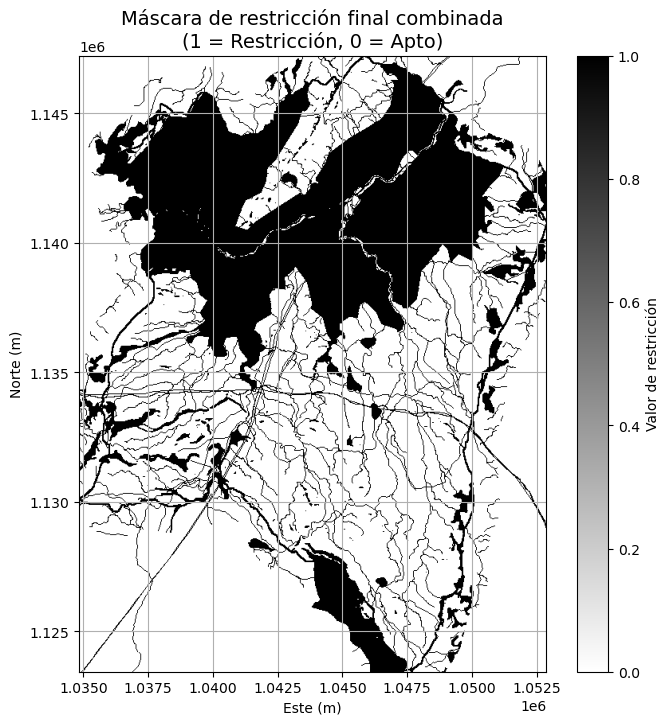

In [64]:
# 1. Pendiente muy alta (>25°)
pendiente_mask = (pendiente > 25).astype("uint8")

# 2. Vías y su buffer de 30m
vias_mask = ((vias == 1) | (dist_vias_m <= 30)).astype("uint8")

# 3. Drenaje sencillo y buffer
drenaje_sencillo_mask = ((drenajes_sencillos == 1) | (dist_d_s_m <= 30)).astype("uint8")

# 4. Drenaje doble y zonas cercanas (≤30m)
drenaje_doble_mask = ((drenajes_dobles == 1) | (dist_d_d_m <= 30)).astype("uint8")

# 5. Centros poblados y su buffer de 100m
cp_mask = ((centros_poblados == 1) | (dist_c_c_m <= 100)).astype("uint8")

# 6. RUNAP – ya es binaria
runap_mask = (runap == 1).astype("uint8")

# 7. Líneas licenciadas (y buffer de 30m)
lic_mask = ((líneas_licenciadas == 1) | (dist_l_l_m <= 30)).astype("uint8")

# 8. Líneas UPME (y buffer de 30m)
upme_mask = ((líneas_UPME == 1) | (dist_l_U_m <= 30)).astype("uint8")

# 9. Biomas – valor 3 es restricción
biomas_mask = (biomas == 3).astype("uint8")

# 10. Coberturas – primer dígito en 1, 3 o 5 es restricción
primer_digito = coberturas // 100
coberturas_mask = np.isin(primer_digito, [1, 3, 5]).astype("uint8")

restriction_mask = np.maximum.reduce([
    pendiente_mask,
    vias_mask,
    drenaje_sencillo_mask,
    drenaje_doble_mask,
    cp_mask,
    runap_mask,
    lic_mask,
    upme_mask,
    biomas_mask,
    coberturas_mask
])

print("✅ Máscara de restricción final creada: 1 = restringido, 0 = permitido")

# Compute extent using affine transform (same as el DEM) ===
xmin, ymax = transform * (0, 0)  # top-left corner
xmax, ymin = transform * (restriction_mask.shape[1], restriction_mask.shape[0])  # bottom-right
extent = [xmin, xmax, ymin, ymax]

# === Plotear máscara de restricción ===
plt.figure(figsize=(8, 8))
plt.imshow(restriction_mask, cmap="gray_r", extent=extent, origin="upper")
plt.title("Máscara de restricción final combinada\n(1 = Restricción, 0 = Apto)", fontsize=14)
plt.xlabel("Este (m)")
plt.ylabel("Norte (m)")
plt.grid(True)
plt.colorbar(label="Valor de restricción")
plt.show()

## 4. Suma ponderada

### 4.1 Matrices de comparación por pares para asignación de pesos

Para integrar múltiples factores en un análisis espacial multicriterio (SMCE), se aplica el Proceso de Jerarquía Analítica (AHP) de Saaty. Este método nos permite asignar importancia relativa a cada criterio mediante comparaciones por pares.

Cada matriz refleja una perspectiva diferente sobre qué factores deben priorizarse en la toma de decisiones.

------

##### 🌳1. Enfoque sostenible 
> Se prioriza: drenajes, coberturas, biomas

Usando la escala de Saaty:

* Igual importancia: 1
* Moderadamente más importante: 3
* Fuertemente más importante: 5
* Mucho más importante: 7
* Extremadamente más importante: 9

| Criterio vs      | Pend | Vías | D. Sencillo | D. Doble | CP | L. Lic | L. UPME | Cob | Biom |
| ---------------- | ---- | ---- | ----------- | -------- | -- | ------ | ------- | --- | ---- |
| Pendiente        | 1    | 1    | 1/3         | 1/3      | 1  | 1      | 1       | 1/5 | 1/5  |
| Vías             |      | 1    | 1/3         | 1/3      | 1  | 1      | 1       | 1/5 | 1/5  |
| Drenaje sencillo |      |      | 1           | 1        | 3  | 3      | 3       | 3   | 3    |
| Drenaje doble    |      |      |             | 1        | 3  | 3      | 3       | 3   | 3    |
| Centros poblados |      |      |             |          | 1  | 1      | 1       | 1/3 | 1/3  |
| Línea licenciada |      |      |             |          |    | 1      | 1       | 1/5 | 1/5  |
| Línea UPME       |      |      |             |          |    |        | 1       | 1/5 | 1/5  |
| Coberturas       |      |      |             |          |    |        |         | 1   | 1    |
| Biomas           |      |      |             |          |    |        |         |     | 1    |

(Se completa con la simetría: si A vs B = 1/3, entonces B vs A = 3)

Resultado esperado (aproximado, tras normalizar y calcular el vector propio):

    * Drenaje sencillo: 0.18
    * Drenaje doble: 0.18
    * Coberturas: 0.22
    * Biomas: 0.22
    * Otros: ~0.05 cada uno

##### 💰 2. Enfoque económico
> Se prioriza: pendiente, vías, líneas licenciadas

| Criterio vs      | Pend | Vías | D. Sencillo | D. Doble | CP | L. Lic | L. UPME | Cob | Biom |
| ---------------- | ---- | ---- | ----------- | -------- | -- | ------ | ------- | --- | ---- |
| Pendiente        | 1    | 3    | 3           | 3        | 5  | 5      | 5       | 3   | 3    |
| Vías             |      | 1    | 3           | 3        | 5  | 5      | 5       | 3   | 3    |
| Drenaje sencillo |      |      | 1           | 1        | 3  | 3      | 3       | 1   | 1    |
| Drenaje doble    |      |      |             | 1        | 3  | 3      | 3       | 1   | 1    |
| Centros poblados |      |      |             |          | 1  | 1      | 1       | 1/3 | 1/3  |
| Línea licenciada |      |      |             |          |    | 1      | 3       | 3   | 3    |
| Línea UPME       |      |      |             |          |    |        | 1       | 1   | 1    |
| Coberturas       |      |      |             |          |    |        |         | 1   | 1    |
| Biomas           |      |      |             |          |    |        |         |     | 1    |

Resultado esperado (aproximado):

    * Pendiente: 0.25
    * Vías: 0.25
    * Línea licenciada: 0.20
    * Otros: menor (0.05–0.10)

##### 🧑‍🤝‍🧑 3. Enfoque social
> Se prioriza: centros poblados

| Criterio vs      | Pend | Vías | D. Sencillo | D. Doble | CP  | L. Lic | L. UPME | Cob | Biom |
| ---------------- | ---- | ---- | ----------- | -------- | --- | ------ | ------- | --- | ---- |
| Pendiente        | 1    | 1    | 1           | 1        | 1/5 | 1      | 1       | 1   | 1    |
| Vías             |      | 1    | 1           | 1        | 1/5 | 1      | 1       | 1   | 1    |
| Drenaje sencillo |      |      | 1           | 1        | 1/3 | 1      | 1       | 1   | 1    |
| Drenaje doble    |      |      |             | 1        | 1/3 | 1      | 1       | 1   | 1    |
| Centros poblados |      |      |             |          | 1   | 3      | 3       | 3   | 3    |
| Línea licenciada |      |      |             |          |     | 1      | 1       | 1   | 1    |
| Línea UPME       |      |      |             |          |     |        | 1       | 1   | 1    |
| Coberturas       |      |      |             |          |     |        |         | 1   | 1    |
| Biomas           |      |      |             |          |     |        |         |     | 1    |

Resultado esperado:

    * Centros poblados: 0.40
    * Otros: 0.06–0.10

In [82]:
# === Paso 1: Pesos normalizados (nuevas matrices AHP más contrastantes) ===

# Enfoque 1: SOSTENIBLE – Prioriza drenajes, coberturas, biomas
weights_sostenible = {
    "pend": 0.03,
    "vias": 0.02,
    "ds": 0.20,
    "dd": 0.20,
    "cp": 0.02,
    "lic": 0.03,
    "upme": 0.03,
    "cob": 0.23,
    "biom": 0.24
}

# Enfoque 2: ECONÓMICO – Prioriza pendiente, vías, líneas licenciadas
weights_economico = {
    "pend": 0.25,
    "vias": 0.25,
    "ds": 0.05,
    "dd": 0.05,
    "cp": 0.05,
    "lic": 0.20,
    "upme": 0.10,
    "cob": 0.025,
    "biom": 0.025
}

# Enfoque 3: SOCIAL – Prioriza centros poblados y vías
weights_social = {
    "pend": 0.05,
    "vias": 0.20,
    "ds": 0.05,
    "dd": 0.05,
    "cp": 0.40,
    "lic": 0.05,
    "upme": 0.05,
    "cob": 0.075,
    "biom": 0.075
}

def calcular_aptitud(w, pend, vias, ds, dd, cp, lic, upme, cob, biom):
    """
    Cálculo de la aptitud total usando combinación lineal ponderada.
    """
    return (
        w["pend"] * pend +
        w["vias"] * vias +
        w["ds"] * ds +
        w["dd"] * dd +
        w["cp"] * cp +
        w["lic"] * lic +
        w["upme"] * upme +
        w["cob"] * cob +
        w["biom"] * biom
    )

# Aplicar para cada enfoque
apt_sostenible = calcular_aptitud(weights_sostenible, pendiente_norm, vias_norm, drenaje_sencillo_norm, drenaje_doble_norm, cp_norm, lineas_lic_norm, lineas_upme_norm, cobertura_norm, biomas_norm)
apt_economico = calcular_aptitud(weights_economico, pendiente_norm, vias_norm, drenaje_sencillo_norm, drenaje_doble_norm, cp_norm, lineas_lic_norm, lineas_upme_norm, cobertura_norm, biomas_norm)
apt_social = calcular_aptitud(weights_social, pendiente_norm, vias_norm, drenaje_sencillo_norm, drenaje_doble_norm, cp_norm, lineas_lic_norm, lineas_upme_norm, cobertura_norm, biomas_norm)

In [83]:
# Zonas con restricción (valor 1) se marcan como -1
apt_sostenible_masked = np.where(restriction_mask == 1, -1, apt_sostenible_masked)
apt_economico_masked = np.where(restriction_mask == 1, -1, apt_economico)
apt_social_masked = np.where(restriction_mask == 1, -1, apt_social)

print("✅ Mapas de aptitud ponderada generados y enmascarados (zonas restringidas = -1).")

✅ Mapas de aptitud ponderada generados y enmascarados (zonas restringidas = -1).


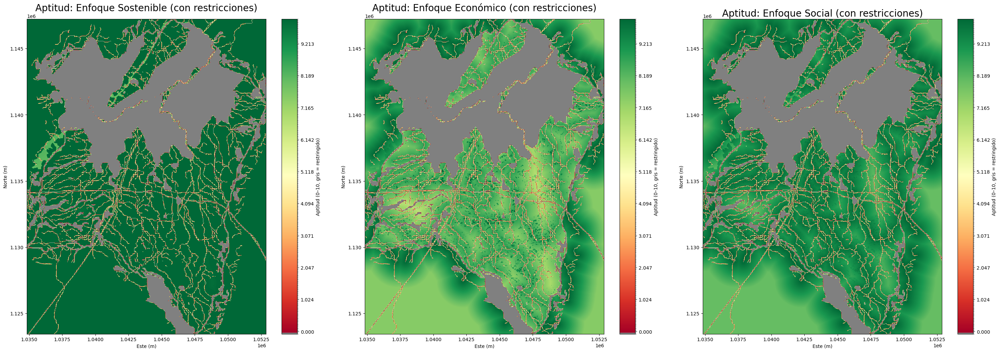

In [84]:
import matplotlib.colors as mcolors

# Crear una copia de las capas de aptitud y aplicar la máscara de restricciones (asignar -1)
apt_sost_masked = np.where(restriction_mask == 1, -1, apt_sostenible_masked)
apt_econ_masked = np.where(restriction_mask == 1, -1, apt_economico_masked)
apt_soc_masked = np.where(restriction_mask == 1, -1, apt_social_masked)

# Crear un mapa de colores rojo-verde continuo, con gris para las áreas restringidas
base_cmap = plt.cm.RdYlGn
cmap_with_mask = mcolors.ListedColormap(['grey'] + [base_cmap(i) for i in range(base_cmap.N)])

# Normalizador: -1 → gris, 0–10 → rojo a verde
bounds = [-1.5, -0.5] + list(np.linspace(0, 10, base_cmap.N - 1))
norm = mcolors.BoundaryNorm(bounds, cmap_with_mask.N)

# Visualización
fig, axs = plt.subplots(1, 3, figsize=(30, 10))

# Enfoque sostenible
im1 = axs[0].imshow(apt_sost_masked, cmap=cmap_with_mask, norm=norm, extent=extent, origin="upper")
axs[0].set_title("Aptitud: Enfoque Sostenible (con restricciones)", fontsize=20)
axs[0].set_xlabel("Este (m)")
axs[0].set_ylabel("Norte (m)")
plt.colorbar(im1, ax=axs[0], label="Aptitud (0–10, gris = restringido)")

# Enfoque económico
im2 = axs[1].imshow(apt_econ_masked, cmap=cmap_with_mask, norm=norm, extent=extent, origin="upper")
axs[1].set_title("Aptitud: Enfoque Económico (con restricciones)", fontsize=20)
axs[1].set_xlabel("Este (m)")
axs[1].set_ylabel("Norte (m)")
plt.colorbar(im2, ax=axs[1], label="Aptitud (0–10, gris = restringido)")

# Enfoque social
im3 = axs[2].imshow(apt_soc_masked, cmap=cmap_with_mask, norm=norm, extent=extent, origin="upper")
axs[2].set_title("Aptitud: Enfoque Social (con restricciones)", fontsize=20)
axs[2].set_xlabel("Este (m)")
axs[2].set_ylabel("Norte (m)")
plt.colorbar(im3, ax=axs[2], label="Aptitud (0–10, gris = restringido)")

plt.tight_layout()
plt.show()

### 4.2 Clasificación y visualización de idoneidad



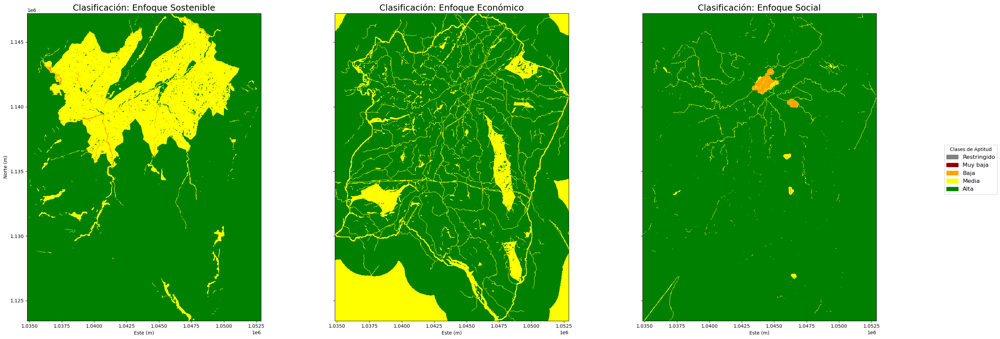

In [85]:
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch

# === Clasificación de aptitud (0–10) en niveles cualitativos ===

def clasificar_aptitud(array_masked):
    """
    Clasifica los valores de aptitud en niveles cualitativos:
    0 = Restringido (-1 original)
    1 = Muy baja (0–2.5)
    2 = Baja (2.5–5.0)
    3 = Media (5.0–7.5)
    4 = Alta (>7.5)
    """
    clasificado = np.full_like(array_masked, 0)
    clasificado[(array_masked > 0) & (array_masked <= 2.5)] = 1
    clasificado[(array_masked > 2.5) & (array_masked <= 5.0)] = 2
    clasificado[(array_masked > 5.0) & (array_masked <= 7.5)] = 3
    clasificado[(array_masked > 7.5)] = 4
    return clasificado

# === Clasificación aplicada ===
clasif_sost = clasificar_aptitud(apt_sostenible)
clasif_econ = clasificar_aptitud(apt_economico)
clasif_soc = clasificar_aptitud(apt_social)

# === Colores y leyenda ===
colores_clases = ListedColormap(["grey", "darkred", "orange", "yellow", "green"])
etiquetas = ["Restringido", "Muy baja", "Baja", "Media", "Alta"]
bordes = [-0.5, 0.5, 1.5, 2.5, 3.5, 4.5]
norma = BoundaryNorm(bordes, colores_clases.N)

fig, axs = plt.subplots(1, 3, figsize=(30, 10), sharex=True, sharey=True)

# === Mapas ===
axs[0].imshow(clasif_sost, cmap=colores_clases, norm=norma, extent=extent, origin="upper")
axs[0].set_title("Clasificación: Enfoque Sostenible", fontsize=18)
axs[0].set_xlabel("Este (m)")
axs[0].set_ylabel("Norte (m)")

axs[1].imshow(clasif_econ, cmap=colores_clases, norm=norma, extent=extent, origin="upper")
axs[1].set_title("Clasificación: Enfoque Económico", fontsize=18)
axs[1].set_xlabel("Este (m)")

axs[2].imshow(clasif_soc, cmap=colores_clases, norm=norma, extent=extent, origin="upper")
axs[2].set_title("Clasificación: Enfoque Social", fontsize=18)
axs[2].set_xlabel("Este (m)")

# === Leyenda ===
leyenda = [Patch(color=colores_clases(i), label=etiquetas[i]) for i in range(len(etiquetas))]
fig.legend(handles=leyenda, loc='center right', title="Clases de Aptitud", fontsize=12)

plt.tight_layout(rect=[0, 0, 0.93, 1])
plt.show()